Benchmark
============

Adding all planners
===========


In [2]:
import matplotlib.pylab as plt
%matplotlib inline
from IPPerfMonitor import IPPerfMonitor

import IPLazyPRM
import IPVISLazyPRM

#import IPRRT
#import IPVISRRT

import IPAStar
import AStarReopening
import IPVISAStar

Set-up of the test scenario and the configuration for all planner
===================================

Following a procedure to compare all discussed planners are shown:

1. Configuration for every planner is defined
2. The configuration and the planner is stored in the variable setup, a Python dict()
3. the variable setup is then used to uniformly call the planning calls


In [3]:
plannerFactory = dict()

astarConfigLow = dict()
astarConfigLow["heuristic"] = 'euclidean' 
astarConfigLow["w"]  = 0.5  
astarConfigLow["num_steps"] = [20, 20, 20] # Pas de ~18° (20^3 noeuds)
astarConfigLow["checkEdgeCollision"] = True
plannerFactory["A* LowRes(18°) w=0.5"] = [IPAStar.AStar, astarConfigLow, IPVISAStar.aStarVisualize]

astarConfigHigh = dict()
astarConfigHigh["heuristic"] = 'euclidean' 
astarConfigHigh["w"]  = 0.5 
astarConfigHigh["num_steps"] = [60, 60, 60] # Pas de ~6° (60^3 noeuds)
astarConfigHigh["checkEdgeCollision"] = True
plannerFactory["A* HighRes(6°) w=0.5"] = [IPAStar.AStar, astarConfigHigh, IPVISAStar.aStarVisualize]

astarConfigOptimal = dict()
astarConfigOptimal["heuristic"] = 'euclidean' 
astarConfigOptimal["w"]  = 0.2  
astarConfigOptimal["num_steps"] = [60, 60, 60] # Pas de ~6° (60^3 noeuds)
astarConfigOptimal["checkEdgeCollision"] = True
plannerFactory["A* Optimal(6°) w=0.2"] = [IPAStar.AStar, astarConfigOptimal, IPVISAStar.aStarVisualize]

astarConfigGreedy = dict()
astarConfigGreedy["heuristic"] = 'euclidean' 
astarConfigGreedy["w"]  = 0.95 
astarConfigGreedy["num_steps"] = [60, 60, 60] # Pas de ~6° (60^3 noeuds)
astarConfigGreedy["checkEdgeCollision"] = True
plannerFactory["A* Greedy(6°) w=0.95"] = [IPAStar.AStar, astarConfigGreedy, IPVISAStar.aStarVisualize]

lazyConfigSparse = dict()
lazyConfigSparse["initialRoadmapSize"] = 50  # Très peu de points au départ
lazyConfigSparse["updateRoadmapSize"]  = 20  # On ajoute peu de points à chaque échec
lazyConfigSparse["kNearest"] = 6             # Connexions limitées
lazyConfigSparse["maxIterations"] = 20       # On abandonne vite
plannerFactory["LazyPRM Sparse (50 nodes)"] = [IPLazyPRM.LazyPRM, lazyConfigSparse, IPVISLazyPRM.lazyPRMVisualize]

lazyConfigDense = dict()
lazyConfigDense["initialRoadmapSize"] = 300 # Beaucoup de points dès le début
lazyConfigDense["updateRoadmapSize"]  = 100 # On ajoute par gros paquets
lazyConfigDense["kNearest"] = 15            # Beaucoup de connexions pour traverser
lazyConfigDense["maxIterations"] = 50 
plannerFactory["LazyPRM Dense (300 nodes)"] = [IPLazyPRM.LazyPRM, lazyConfigDense, IPVISLazyPRM.lazyPRMVisualize]




In [4]:
def compute_path_lengths_multi(graph, solution, theta_in_radians=True):
    """
    Berechnet die Gesamtpfadläng pro Roboter in einem Graphen mit mehreren Robotern

    Das Knotenattribut 'pos' ist eine sequenz [x1,y1,theta1, x2,y2,theta2,...]
    Für unsere zwei Roboter sind es 6 Einträge pro Knoten.
    Die Funktion summiert die euklidischen Distanzen zwischen jedem Knotenpaar (Kanten) in der xy-Ebene für jeden Roboter auf.
    """
    import numpy as np
    import networkx as nx

    # Falls keine Lösung oder nur ein Knoten vorhanden ist, sofort Nullwerte zurückgeben
    if not solution or len(solution) < 2:
        return {
            'green': {'total': 0.0},
            'red': {'total': 0.0},
            'segments': 0
        }

    # Hole alle 'pos' Attribute aus dem Graph (dict: node -> config)
    pos_attr = nx.get_node_attributes(graph, 'pos')
    total_g = 0.0  # aufsummierte Distanz für grünen Roboter (Roboter 1)
    total_r = 0.0  # aufsummierte Distanz für roten Roboter (Roboter 2)
    segments = 0   # Anzahl der Segmente (Anzahl Kanten im Pfad)

    # Iteriere über alle aufeinanderfolgenden Knotenpaare der Lösung
    for i in range(len(solution) - 1):
        a = solution[i]; b = solution[i + 1]
        # Fehler, falls ein Knoten kein 'pos' Attribut hat (schützt vor inkonsistenten Graphen)
        if a not in pos_attr or b not in pos_attr:
            raise ValueError(f"Node {a} or {b} missing 'pos' attribute in graph")
        pa = np.array(pos_attr[a], dtype=float)  # Konfiguration an Knoten a
        pb = np.array(pos_attr[b], dtype=float)  # Konfiguration an Knoten b

        # Berechne Euklidische Distanz in der xy‑Ebene für Roboter 1 (grün)
        # pa[0:2] und pb[0:2] sind [x1,y1] für Roboter 1
        total_g += float(np.linalg.norm(pb[0:2] - pa[0:2]))

        # Berechne Euklidische Distanz in der xy‑Ebene für Roboter 2 (rot)
        # pa[3:5] und pb[3:5] sind [x2,y2] für Roboter 2
        total_r += float(np.linalg.norm(pb[3:5] - pa[3:5]))

        segments += 1  # ein weiteres Kanten-Segment wurde betrachtet

    # Rückgabe: pro Roboter nur die 'total' Länge (Rotationen werden hier bewusst nicht berücksichtigt)
    return {
        'green': {'total': total_g},
        'red': {'total': total_r},
        'segments': segments
    }

In [5]:
class ResultCollection (object):
    
    def __init__(self, plannerFactoryName, planner, benchmark, solution, perfDataFrame):
        self.plannerFactoryName = plannerFactoryName
        self.planner = planner
        self.benchmark = benchmark
        self.solution = solution
        self.perfDataFrame = perfDataFrame

In [6]:
import IPTestSuite3 as ts
from shapely.geometry import Point, Polygon, LineString
from shapely import plotting
from IPEnvironmentKin import animateSolution, planarRobotVisualize


In [7]:
fullBenchList = ts.benchList

for benchmark in fullBenchList:
    print(benchmark.name)

obst
window_env


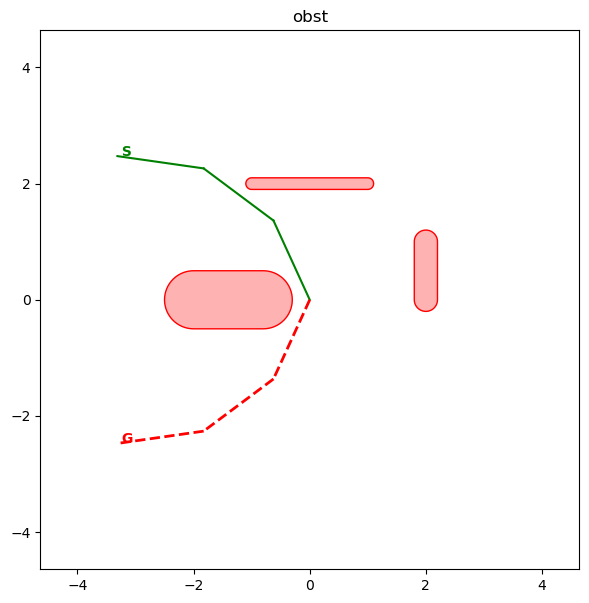

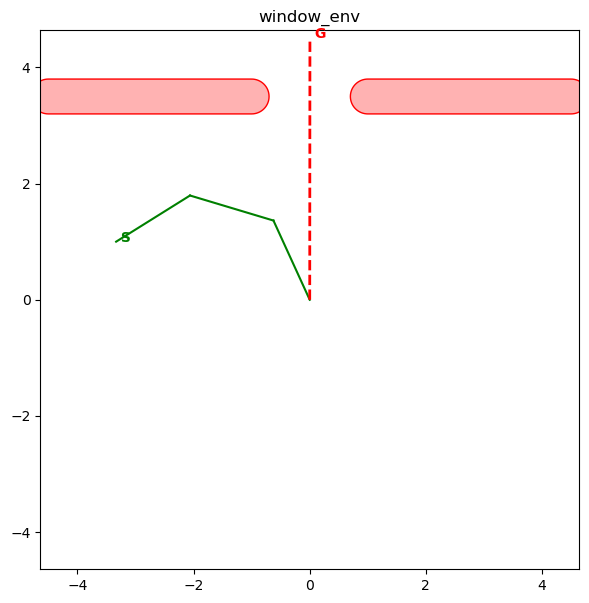

In [8]:
for benchmark in fullBenchList:
    fig_local = plt.figure(figsize=(7,7))
    ax = fig_local.add_subplot(1,1,1)
    title = benchmark.name
    ax.set_title(title)
    x_limits = benchmark.collisionChecker.getEnvironmentLimits()[0]
    y_limits = benchmark.collisionChecker.getEnvironmentLimits()[1]
    margex = 1.5
    margey = 1.5
    ax.set_xlim([x_limits[0] - margex, x_limits[1] + margex])
    ax.set_ylim([y_limits[0] - margey, y_limits[1] + margey])
    ax.set_aspect('equal')
    #ax.set_xlim(benchmark.collisionChecker.getEnvironmentLimits()[0])
    #ax.set_ylim(benchmark.collisionChecker.getEnvironmentLimits()[1])
    #plotting.plot_points(Point(benchmark.startList[0]).buffer(.3), color="g", ax=ax)
    #plotting.plot_points(Point(benchmark.goalList[0]).buffer(.3), color="b", ax=ax)

    benchmark.collisionChecker.drawObstacles(ax,True)

    robot = benchmark.collisionChecker.kin_chain
    robot.move(benchmark.startList[0])
    start_pos = robot.get_transforms()[-1]
    ax.text(start_pos[0], start_pos[1], " S", color="green", fontweight="bold")
    planarRobotVisualize(robot, ax)
   
    robot.move(benchmark.goalList[0])
    
    # On trace manuellement en rouge pour différencier du vert
    joint_positions = robot.get_transforms()
    for i in range(1, len(joint_positions)):
        xs = [joint_positions[i-1][0], joint_positions[i][0]]
        ys = [joint_positions[i-1][1], joint_positions[i][1]]
        ax.plot(xs, ys, color='r', linestyle='--', linewidth=2)

    # Marqueur pour l'arrivée (bout du bras)
    ax.text(joint_positions[-1][0], joint_positions[-1][1], " G", color="red", fontweight="bold")
   
   

        
    #except Exception as e:
    #    print ("Error", e)
    #    pass
    plt.show()

In [9]:
resultList = list()
testList = fullBenchList

for key,producer in list(plannerFactory.items()):
    print(key, producer)
    for benchmark in testList:
        print ("Planning: " + key + " - " + benchmark.name)
        #planner = IPBasicPRM.BasicPRM(benchmark.collisionChecker)
        planner = producer[0](benchmark.collisionChecker)
        IPPerfMonitor.clearData()
        try:
            
            resultList.append(ResultCollection(key,
                                          planner, 
                                           benchmark, 
                                           planner.planPath(benchmark.startList,benchmark.goalList,producer[1]),
                                           IPPerfMonitor.dataFrame()
                                          ),
                        )
        except Exception as e:
        #    throw e
            print ("PLANNING ERROR ! PLANNING ERROR ! PLANNING ERROR ", e)
            pass



A* LowRes(18°) w=0.5 [<class 'IPAStar.AStar'>, {'heuristic': 'euclidean', 'w': 0.5, 'num_steps': [20, 20, 20], 'checkEdgeCollision': True}, <function aStarVisualize at 0x0000022F40E65F80>]
Planning: A* LowRes(18°) w=0.5 - obst
Planning: A* LowRes(18°) w=0.5 - window_env
Planning failed
A* HighRes(6°) w=0.5 [<class 'IPAStar.AStar'>, {'heuristic': 'euclidean', 'w': 0.5, 'num_steps': [60, 60, 60], 'checkEdgeCollision': True}, <function aStarVisualize at 0x0000022F40E65F80>]
Planning: A* HighRes(6°) w=0.5 - obst
Planning: A* HighRes(6°) w=0.5 - window_env
A* Optimal(6°) w=0.2 [<class 'IPAStar.AStar'>, {'heuristic': 'euclidean', 'w': 0.2, 'num_steps': [60, 60, 60], 'checkEdgeCollision': True}, <function aStarVisualize at 0x0000022F40E65F80>]
Planning: A* Optimal(6°) w=0.2 - obst
Planning: A* Optimal(6°) w=0.2 - window_env
A* Greedy(6°) w=0.95 [<class 'IPAStar.AStar'>, {'heuristic': 'euclidean', 'w': 0.95, 'num_steps': [60, 60, 60], 'checkEdgeCollision': True}, <function aStarVisualize at 0x

In [12]:
for bench in testList:
    for result in resultList:
        if result.benchmark.name == bench.name:
            if result.solution is not None and len(result.solution) > 0:
                print(result.plannerFactoryName)
                animateSolution(result.planner, bench.collisionChecker, result.solution, plannerFactory[result.plannerFactoryName][2], workSpaceLimits=[[-4.5,4.5],[-4.5,4.5]])
            else:
                print("No solution found for ", result.plannerFactoryName)

A* LowRes(18°) w=0.5


A* HighRes(6°) w=0.5


A* Optimal(6°) w=0.2


A* Greedy(6°) w=0.95


No solution found for  LazyPRM Sparse (50 nodes)
LazyPRM Dense (300 nodes)


No solution found for  A* LowRes(18°) w=0.5
A* HighRes(6°) w=0.5


A* Optimal(6°) w=0.2


A* Greedy(6°) w=0.95


LazyPRM Sparse (50 nodes)


LazyPRM Dense (300 nodes)


A* LowRes(18°) w=0.5
35
88.76209425926208
1048
{'green': {'total': 7.881485166107028}, 'red': {'total': 0.0}, 'segments': 34}
A* HighRes(6°) w=0.5
97
693.2635469436646
20087
{'green': {'total': 7.799510537112719}, 'red': {'total': 0.0}, 'segments': 96}
A* Optimal(6°) w=0.2
97
1607.1670863628387
48008
{'green': {'total': 7.799510537112719}, 'red': {'total': 0.0}, 'segments': 96}
A* Greedy(6°) w=0.95
125
60.93908357620239
1420
{'green': {'total': 8.427710537112718}, 'red': {'total': 0.0}, 'segments': 124}
LazyPRM Sparse (50 nodes)
0
9.077009677886963
1721
{'green': {'total': 0.0}, 'red': {'total': 0.0}, 'segments': 0}
LazyPRM Dense (300 nodes)
10
22.39604115486145
1500
{'green': {'total': 8.924922899797306}, 'red': {'total': 0.0}, 'segments': 9}


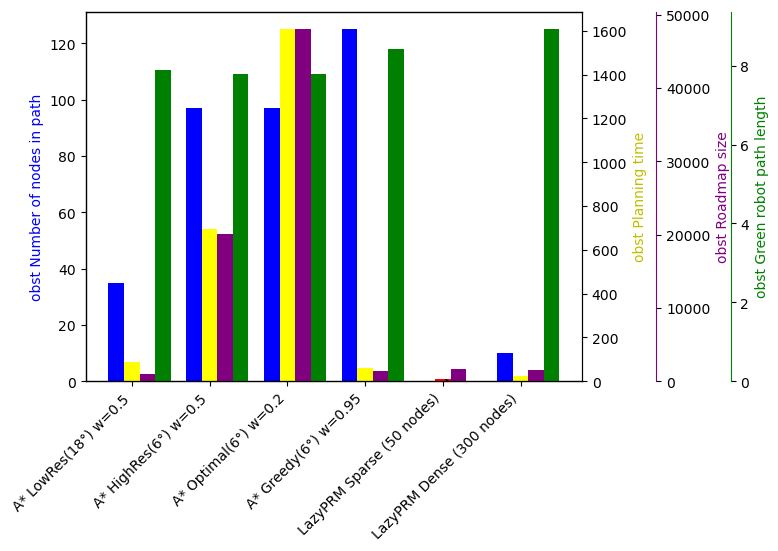

A* LowRes(18°) w=0.5
0
375.8593101501465
7770
{}
A* HighRes(6°) w=0.5
39
213.15769290924072
7541
{'green': {'total': 2.529571075474386}, 'red': {'total': 0.0}, 'segments': 38}
A* Optimal(6°) w=0.2
39
877.9750556945801
24767
{'green': {'total': 2.529571075474386}, 'red': {'total': 0.0}, 'segments': 38}
A* Greedy(6°) w=0.95
51
166.54745864868164
3609
{'green': {'total': 2.529571075474386}, 'red': {'total': 0.0}, 'segments': 50}
LazyPRM Sparse (50 nodes)
6
1.9675016403198242
159
{'green': {'total': 8.24422718423565}, 'red': {'total': 0.0}, 'segments': 5}
LazyPRM Dense (300 nodes)
6
6.779285430908203
2246
{'green': {'total': 4.484814787497362}, 'red': {'total': 0.0}, 'segments': 5}


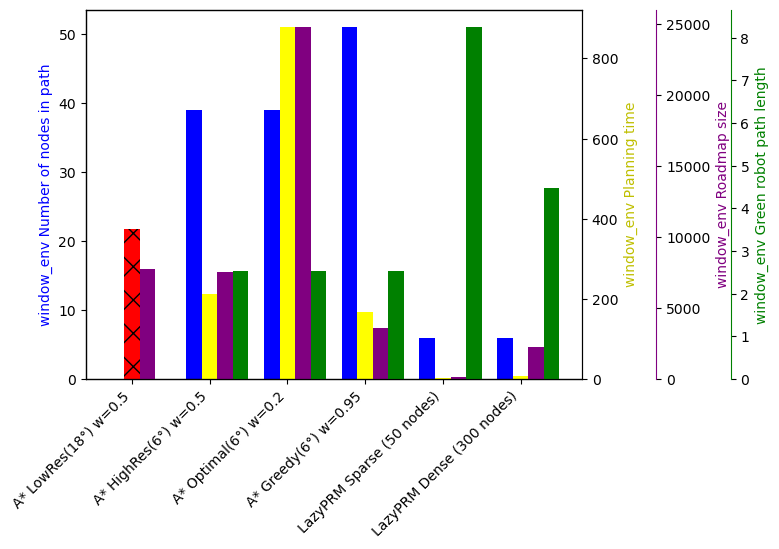

In [11]:
import numpy as np
for bench in testList:
    title = bench.name
    pathLength = dict()
    planningTime = dict()
    roadmapSize  = dict()
    res=dict()
    
    try:
        for result in resultList:
            if result.benchmark.name == bench.name:
                if result.solution is None:
                    pathLength[result.plannerFactoryName] = 0
                    planningTime[result.plannerFactoryName] = result.perfDataFrame.groupby(["name"]).sum(numeric_only=True)["time"]["planPath"]
                    roadmapSize[result.plannerFactoryName] = result.planner.graph.size()
                    res[result.plannerFactoryName] = {}
                else:
                    pathLength[result.plannerFactoryName] = len(result.solution)
                    planningTime[result.plannerFactoryName] = result.perfDataFrame.groupby(["name"]).sum(numeric_only=True)["time"]["planPath"]
                    roadmapSize[result.plannerFactoryName] = result.planner.graph.size()
                    res[result.plannerFactoryName] = compute_path_lengths_multi(result.planner.graph, result.solution, theta_in_radians=True)
                print(result.plannerFactoryName)
                print(pathLength[result.plannerFactoryName])
                print(planningTime[result.plannerFactoryName])
                print(roadmapSize[result.plannerFactoryName])
                print(res[result.plannerFactoryName])


        fig, ax = plt.subplots()

        width = 0.2

        ax.bar(np.arange(len(pathLength.keys())), pathLength.values(),width, color="blue")
        ax.set_ylabel(title + " Number of nodes in path", color="blue")
        ax.set_xticks(np.arange(len(pathLength.keys())) + width)
        ax.set_xticklabels(pathLength.keys(), rotation=45, ha="right")

        ax2 = ax.twinx()
        bar = ax2.bar(np.arange(len(pathLength.keys()))+width, planningTime.values(),width, color="red")
        ax2.set_ylabel(title + " Planning time", color="y")

        # Add coloring and patterns on axis two
        hatches = ['x' if length==0 else '' for length in pathLength.values()]
        color   = ['red' if length==0 else 'yellow' for length in pathLength.values()]
        for i,thisbar in enumerate(bar.patches):
            thisbar.set_facecolor(color[i])
            thisbar.set_hatch(hatches[i])

        # Multiple axes 
        ax3 = ax.twinx()
        ax3.bar(np.arange(len(pathLength.keys()))+2*width, roadmapSize.values(),width, color="purple")
        ax3.set_ylabel(title + " Roadmap size",  color="purple")
        ax3.spines['right'].set_position(('axes', 1.15))
        ax3.spines['right'].set_color("purple")

        ax4 = ax.twinx()
        ax4.bar(np.arange(len(pathLength.keys()))+3*width, [res[planner].get('green', {}).get('total', 0) for planner in pathLength.keys()], width, color="green")
        ax4.set_ylabel(title + " Green robot path length", color="green")
        ax4.spines['right'].set_position(('axes', 1.3))
        ax4.spines['right'].set_color("green")

    except:
        pass

    plt.show()


    
        
    